# Dataset Statistics for Perception Package Projects
This example notebook shows how to use datasetinsights to load synthetic datasets generated from the [Perception package](https://github.com/Unity-Technologies/com.unity.perception) and visualize dataset statistics. It includes statistics and visualizations of the outputs built into the Perception package and should give a good idea of how to use datasetinsights to visualize custom annotations and metrics.

## Setup dataset
If the dataset was generated locally, point `data_root` below to the path of the dataset. The `GUID` folder suffix should be changed accordingly.   

In [26]:
run_execution_id1 = "aMVZ5zM"
run_execution_id2 = "yj16PGN"
data_root1 = f"/Users/bowen.li/data/synthetic/{run_execution_id1}"
data_root2 = f"/Users/bowen.li/data/synthetic/{run_execution_id2}"

### Unity Simulation [Optional]
If the dataset was generated on Unity Simulation, the following cells can be used to download the metrics needed for dataset statistics.

Provide the `run-execution-id` which generated the dataset and a valid `access_token` in the following cell. The `access_token` can be generated using the Unity Simulation [CLI](https://github.com/Unity-Technologies/Unity-Simulation-Docs/blob/master/doc/cli.md#usim-inspect-auth).

In [ ]:
from datasetinsights.io.downloader import UnitySimulationDownloader

#access_token:
access_token = "eu-HtLqztZNA8o8CSjgflkuIG0wxNmlMezMTdAOAGis001f"
#annotation definition id:
annotation_definition_id = "f9f22e05-443f-4602-a422-ebe4ea9b55cb"
#unity project id
project_id = "13692a20-33d5-43de-99b0-ec4512d40af4"
source_uri = f"usim://{project_id}/{run_execution_id1}"

downloader = UnitySimulationDownloader(access_token=access_token)
downloader.download(source_uri=source_uri, output=data_root1)

In [ ]:
source_uri = f"usim://{project_id}/{run_execution_id2}"

downloader = UnitySimulationDownloader(access_token=access_token)
downloader.download(source_uri=source_uri, output=data_root2)

### Load COCO real data

In [27]:
from pycocotools.coco import COCO
import math
import numpy as np
import skimage.io as io
import random
import os
import cv2
import pandas as pd
import plotly.express as px

## For visualizing results
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline

In [28]:
dataDir='/Users/bowen.li/data/coco_cat'
dataType='train'
category = 'cat'
annFile='{}/annotations/instances_{}2017.json'.format(dataDir,dataType)

In [29]:
# initialize the COCO api for instance annotations
coco=COCO(annFile)
# display COCO categories and supercategories
catIDs = coco.getCatIds()
cats = coco.loadCats(catIDs)
nms=[cat['name'] for cat in cats]

loading annotations into memory...
Done (t=0.11s)
creating index...
index created!


In [30]:
filterClasses = [category]
catIds = coco.getCatIds(catNms=filterClasses);
imgIds = coco.getImgIds(catIds=catIds);
print("Number of images containing all required classes:", len(imgIds))

Number of images containing all required classes: 4114


In [31]:
import pandas as pd

anns = []
counter = []
pixels_count = []
for i in range(len(imgIds)):
    annIds = coco.getAnnIds(coco.loadImgs(imgIds[i])[0]['id'], catIds=catIds, iscrowd=None)
    size = len(annIds)
    anns.append(annIds)
    visible_pixels = coco.loadAnns(annIds)[0]["area"]
    pixels_count.append([i, visible_pixels])
    counter.append([i, size])
counter = pd.DataFrame(counter, columns=["id", "count"])
pixels_count = pd.DataFrame(pixels_count, columns=["id", "visible_pixels"])

In [32]:
display(histogram_plot(
        counter, 
        x="count",  
        x_title="Object Counts Per Capture",
        y_title="Percent (%)",
        title="Distribution of Object Counts Per Capture (COCO-cat real data)",
        max_samples=max_samples,
        histnorm='percent',
        nbins=15
    ))

## Load dataset metadata
Once the dataset metadata is downloaded, it can be loaded for statistics using `datasetinsights.data.simulation`. Annotation and metric definitions are loaded into pandas dataframes using `AnnotationDefinitions` and `MetricDefinitions` respectively.

In [33]:
from datasetinsights.datasets.unity_perception import AnnotationDefinitions, MetricDefinitions
ann_def1 = AnnotationDefinitions(data_root1)
ann_def2 = AnnotationDefinitions(data_root2)
metric_def1 = MetricDefinitions(data_root1)
metric_def2 = MetricDefinitions(data_root2)

## Built-in Statistics
The following tables and charts are supplied by `datasetinsights.data.datasets.statistics.RenderedObjectInfo` on datasets that include the "rendered object info" metric.

In [34]:
from datasetinsights.stats.statistics import RenderedObjectInfo
import datasetinsights.datasets.unity_perception.metrics as metrics
from datasetinsights.datasets.unity_perception.exceptions import DefinitionIDError
from datasetinsights.stats import bar_plot, histogram_plot, rotation_plot

max_samples = 10000          # maximum number of samples points used in histogram plots

rendered_object_info_definition_id = "5ba92024-b3b7-41a7-9d3f-c03a6a8ddd01"
roinfo = None
try:
    roinfo1 = RenderedObjectInfo(data_root=data_root1, def_id=rendered_object_info_definition_id)
except DefinitionIDError:
    print("No RenderedObjectInfo in this dataset")
try:
    roinfo2 = RenderedObjectInfo(data_root=data_root2, def_id=rendered_object_info_definition_id)
except DefinitionIDError:
    print("No RenderedObjectInfo in this dataset")

### Descriptive Statistics

In [35]:
if roinfo1 is not None:
    per_capture_count1 = roinfo1.per_capture_counts()
if roinfo2 is not None:
    per_capture_count2 = roinfo2.per_capture_counts()

In [14]:
len(per_capture_count2["count"])

80754

In [40]:
df = pd.DataFrame(dict(
    data=np.concatenate(([f"COCO-cat"] * len(counter["count"]), [f"{run_execution_id1}"] * len(per_capture_count1["count"]))),
    object_count=np.concatenate((counter["count"], per_capture_count1["count"]))
))
fig = px.histogram(df, x="object_count", color="data", barmode="overlay", histnorm='percent')
fig = fig.update_layout(
    xaxis=dict(title="Object Counts Per Capture"), yaxis=dict(title="Percent (%)"), title_text="Distribution of Object Counts Per Capture (COCO-cat vs Baseline dataset)",
)
display(fig)

In [43]:
from scipy import stats
stats.ks_2samp(counter["count"], per_capture_count1["count"])

Ks_2sampResult(statistic=0.6910970088127104, pvalue=0.0)

In [41]:
df = pd.DataFrame(dict(
    data=np.concatenate(([f"COCO-cat"] * len(counter["count"]), [f"{run_execution_id2}"] * len(per_capture_count2["count"]))),
    object_count=np.concatenate((counter["count"], per_capture_count2["count"]))
))
fig = px.histogram(df, x="object_count", color="data", barmode="overlay", histnorm='percent')
fig = fig.update_layout(
    xaxis=dict(title="Object Counts Per Capture"), yaxis=dict(title="Percent (%)"), title_text="Distribution of Object Counts Per Capture (COOC-cat vs Aligned dataset)",
)
display(fig)

In [44]:
from scipy import stats
stats.ks_2samp(counter["count"], per_capture_count2["count"])

Ks_2sampResult(statistic=0.08162390343284986, pvalue=2.8356542439866165e-23)

### Per Capture Object Count

In [5]:
if roinfo1 is not None:
    display(histogram_plot(
        per_capture_count1, 
        x="count",  
        x_title="Object Counts Per Capture",
        y_title="Percent (%)",
        title="Distribution of Object Counts Per Capture (Synthetic Cat data)",
        max_samples=max_samples,
        histnorm='percent',
        nbins=10
    ))

In [6]:
display(histogram_plot(
        per_capture_count2, 
        x="count",  
        x_title="Object Counts Per Capture",
        y_title="Percent (%)",
        title="Distribution of Object Counts Per Capture (Synthetic Cat data)",
        max_samples=max_samples,
        histnorm='percent',
        nbins=10
    ))

### Object Visible Pixels

In [14]:
visible_pixels1 = roinfo1.raw_table["visible_pixels"]
visible_pixels2 = roinfo2.raw_table["visible_pixels"]
print("Data 1 mean pixels per object: ", visible_pixels1.mean())
print("Data 2 mean pixels per object: ", visible_pixels2.mean())

Data 1 mean pixels per object:  11950.09904404716
Data 2 mean pixels per object:  16669.98148900275


In [15]:
import plotly.express as px
df =pd.DataFrame(dict(
    series=np.concatenate(([f"{run_execution_id1}"]*visible_pixels1.size, [f"{run_execution_id2}"]*visible_pixels2.size)), 
    data=np.concatenate((visible_pixels1, visible_pixels2))
))

fig = px.histogram(df, x="data", color="series", barmode="overlay", nbins=10000, histnorm='percent')
fig.update_layout(
    xaxis_title="Visible Pixels Per Object", yaxis_title="Percent (%)", title=f"PDF of Visible Pixels Per Object ({run_execution_id1} vs {run_execution_id2})",
)

Text(0, 0.5, 'Probability')

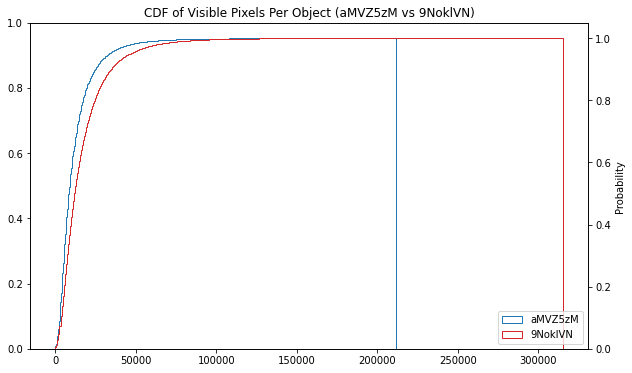

In [16]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10,6))
ax2 = ax.twinx()
n, bins, patches = ax2.hist(visible_pixels1, density=True, cumulative=1, histtype='step', bins=500, color='tab:blue')
n, bins, patches = ax2.hist(visible_pixels2, density=True, cumulative=1, histtype='step', bins=500, color='tab:red')
ax2.legend([f"{run_execution_id1}", f"{run_execution_id2}"], loc='lower right')
ax2.set_title(f"CDF of Visible Pixels Per Object ({run_execution_id1} vs {run_execution_id2})")
plt.xlabel("visible_pixels")
plt.ylabel("Probability")